In [542]:

import sys
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt

# Q1: Own Calibration [4 points]

### 1. [1 point] For the given image calib-object.jpg, identify the chessboard internal corners. You may use external libraries to detect the chessboard corners. Note, each square of the chess board is 2cm × 2cm.

In [543]:
def draw_points(image, corners):
    """Draws circles and puts text on the detected corners."""
    for idx, corner in enumerate(corners):
        point = corner.ravel()
        x, y = map(int, point)
        cv.circle(image, (x, y), 13, (0, 255, 255), -1)  # Increased circle radius to 13
        cv.putText(image, f'{idx}: ({x}, {y})', (x + 10, y - 10), cv.FONT_HERSHEY_SIMPLEX, 0.7, (255, 0, 255), 5, cv.LINE_AA)
def display_image(image):
    """Displays the input image."""
    plt.figure(figsize=(18, 18))  
    plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
    plt.show()

### Find Inner Corners

In [544]:
img = cv.imread('calib-object.jpg')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
corners = cv.goodFeaturesToTrack(gray, 140, 0.275, 130)
corners = np.int0(corners)


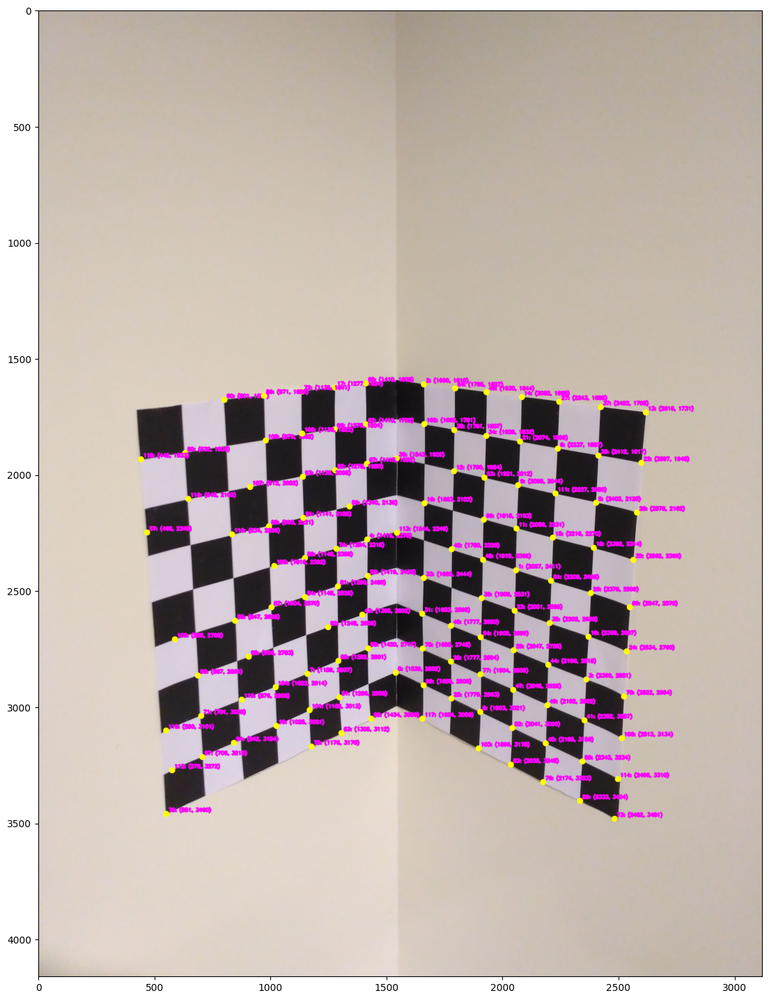

In [545]:
draw_points(img, corners)
display_image(img)

### Define world and image points

In [546]:
P_C = np.array([corners[34][0], 
corners[21][0], 
corners[99][0],
corners[117][0], 
corners[81][0],
corners[87][0], 
corners[108][0], 
corners[110][0]], dtype=np.float32)

W_C = np.array([[6, 2, 0], 
[8, 2, 0], 
[2, 16, 0], 
[2, 18, 0], 
[0, 10, 4],
[0,10,8], 
[0, 2, 8], 
[0, 6, 10]], dtype=np.float32 )


### 2. [1.5 points] Implement the camera calibration process discussed in the lecture. Assume a world origin, create a set of corresponding points in the world coordinate and image plane, compute both extrinsics (translation vector, rotation matrix) and intrinsics (assume no skew) without using any external libraries for the calib-object.jpg image.

In [547]:

import numpy as np

def extract_parameters(projection_matrix):
    # Extract rotational part (intrinsics) and translation part from the projection matrix
    rotational_part = projection_matrix[:, :3]
    translation_part = projection_matrix[:, 3]

    # Perform QR decomposition to obtain intrinsic matrix and rotation matrix
    Q, R = np.linalg.qr(rotational_part.T)

    # Ensure diagonal of R is positive
    signs = np.sign(np.diag(R))
    Q *= signs
    R *= signs[:, np.newaxis]

    # Calculate the intrinsic matrix K
    K = np.linalg.inv(R)
    K /= K[2, 2]

    # Correct scaling of K
    if K[0, 0] > 0:
        K *= -1

    # Calculate translation vector
    translation_vector = np.dot(np.linalg.inv(K), translation_part)

    # Calculate rotation matrix
    rotation_matrix = Q.T

    return K, rotation_matrix, translation_vector



### Perform camera calibration

In [548]:

num_points = len(W_C)

# Construct matrix A using list comprehensions
A = np.array([[X, Y, Z, 1, 0, 0, 0, 0, -x * X, -x * Y, -x * Z, -x] for (X, Y, Z), (x, _) in zip(W_C, P_C)] +
                [[0, 0, 0, 0, X, Y, Z, 1, -y * X, -y * Y, -y * Z, -y] for (X, Y, Z), (_, y) in zip(W_C, P_C)])

# Perform Singular Value Decomposition (SVD) on matrix A
_, _, V = np.linalg.svd(A)

# Extract the last row of V and reshape it into a 3x4 matrix
P = V[-1].reshape(3, 4)



### Extract parameters

In [549]:
K, R, T = extract_parameters(P)

In [550]:


# Output results
print("Intrinsic Matrix (K):")
print(K)

print("\nRotation Matrix (R):")
print(R)

print("\nTranslation Vector (T):")
print(T)

print("\nCamera Calibration Matrix (P):")
print(P)

Intrinsic Matrix (K):
[[-1.89778360e-04  3.14741539e-05  6.75038727e-05]
 [-0.00000000e+00 -1.86231150e-04  8.86811692e-05]
 [-0.00000000e+00 -0.00000000e+00 -1.00000000e+00]]

Rotation Matrix (R):
[[-0.39280115 -0.08725692  0.91547446]
 [ 0.22265798 -0.97489312  0.00261519]
 [ 0.89226156  0.20486494  0.40236758]]

Translation Vector (T):
[4.30116799e+03 3.84615185e+03 4.50128714e-04]

Camera Calibration Matrix (P):
[[-1.64601196e-02 -3.65645403e-03  3.83624622e-02 -6.95214202e-01]
 [ 6.72622432e-03 -4.22484603e-02  6.59515598e-03 -7.16273241e-01]
 [ 6.58113077e-06 -2.36426702e-06  6.37433306e-06 -4.50128714e-04]]


### 3. [1 point] Use the real-world measurements along with the estimated camera parameters to compute the image of a wireframe of the object (Hint: the wireframe is the outer corners of the actual chessboard pattern and has 6 points). Note that you should compute the location of image points as xi = PXi, where P is the projection matrix computed above. Overlay (draw) the wireframe over the actual image of the object using straight lines between the computed points xi. What do you observe about the overlay?

In [551]:
def compute_P_C(projection_matrix, world_coords_sample):
    # Append 1 to make it homogeneous
    world_coords_sample_homogeneous = np.append(world_coords_sample, 1)
    
    # Compute pixel coordinates (u, v)
    homogeneous_pixel_coords = np.dot(projection_matrix, world_coords_sample_homogeneous)
    u = homogeneous_pixel_coords[0] / homogeneous_pixel_coords[2]
    v = homogeneous_pixel_coords[1] / homogeneous_pixel_coords[2]
    
    return u, v



In [552]:
def get_pixel_coord(W_C, projection_matrix):
    # Iterate over each world coordinate and compute its pixel coordinates
    P_C =[]
    for world_co in W_C:
        pixel_co = compute_P_C(projection_matrix, world_co)
        P_C.append(pixel_co)

    # Convert the list to a NumPy array
    P_C = np.array(P_C)

    return P_C


In [553]:
wireframes_W_C = np.array([[0,0,0],[14,0,0],[14,18,0],[0,18,0],[0,18,14],[0,0,14]])
wireframes_P_C = get_pixel_coord(wireframes_W_C,P)

In [554]:

def Wireframe(img_path, P_C, line_indices):
    # Load the image
    img = cv.imread(img_path)
    draw_points(img,P_C)
    # Draw lines between selected points
    for start_idx, end_idx in line_indices:
        start_point = tuple(map(int, P_C[start_idx]))
        end_point = tuple(map(int, P_C[end_idx]))
        cv.line(img, start_point, end_point, (50, 50, 50), 5)  # Draw lines in blue color

    display_image(img)
       


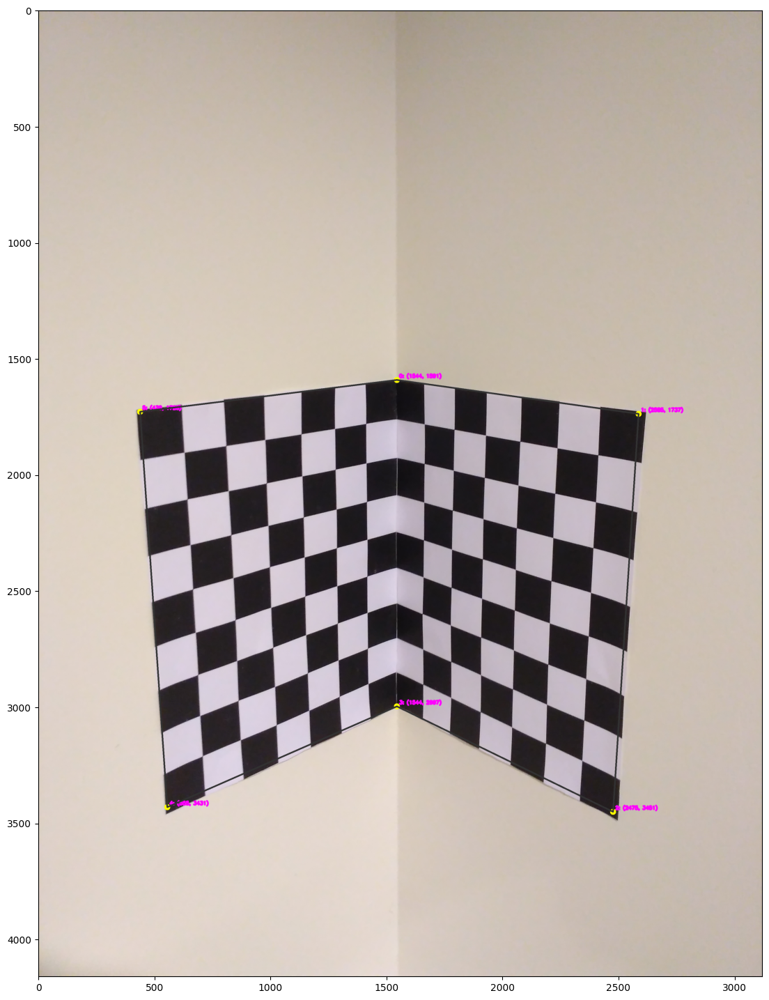

In [555]:
img_path = 'calib-object.jpg'
line_indices = [(0, 1), (1, 2), (2, 3), (3, 4), (4, 5), (5, 0)]
Wireframe(img_path, wireframes_P_C, line_indices) 

So, Overlay of wireframe is not accurate but close  enough for my needs.<br>
It may be due to selection of corner points during calculation of camera matrix and approximation done durring plotting. 

### 4. [0.5 points] Given the rotation matrix, compute the three rotation angles. Explain the values that you obtain in terms of pan, tilt, and roll?

In [556]:
def euler_angles(rotation_matrix):
    sy = np.sqrt(rotation_matrix[0, 0] ** 2 + rotation_matrix[1, 0] ** 2)
    singular = sy < 1e-6

    if not singular:
        roll = np.arctan2(rotation_matrix[2, 1], rotation_matrix[2, 2])
        pitch = np.arctan2(-rotation_matrix[2, 0], sy)
        yaw = np.arctan2(rotation_matrix[1, 0], rotation_matrix[0, 0])
    else:
        roll = np.arctan2(-rotation_matrix[1, 2], rotation_matrix[1, 1])
        pitch = np.arctan2(-rotation_matrix[2, 0], sy)
        yaw = 0

    return pitch, roll, yaw


In [557]:

# Assuming R is your rotation matrix
pitch, roll, yaw = euler_angles(R)

print("Pitch (theta):", np.degrees(pitch), "degrees")
print("Roll (phi):", np.degrees(roll), "degrees")
print("Yaw (psi):", np.degrees(yaw), "degrees")


Pitch (theta): -63.15882327333737 degrees
Roll (phi): 26.982861431115893 degrees
Yaw (psi): 150.45341655263377 degrees


### Explaination :
- Pan is often used interchangeably with yaw, describing the left-right movement.
- Tilt corresponds to pitch, representing the up-down movement.
- Roll remains the same, indicating the side-to-side rotation.


# Q2: OpenCV Calibration [3 points]


### 1. [1.5 points] Now repeat the camera calibration process for calib-object.jpg using OpenCV calibration func- tions, continue to assume that there is no skew or distortion (Hint: see calibrateCamera() FLAGS). How does your result compare with Q1 above? Repeat the overlay of the wireframe using the new parameters. Describe your observations.

In [558]:
P_C = np.array([ corners[18][0], corners[16][0],corners[99][0],corners[34][0],corners[21][0],corners[111][0],corners[52][0],corners[40][0],], dtype=np.float32)

W_C = np.array([[12, 6, 0],[2,6,0], [2, 16, 0],[6, 2, 0], [8,2,0],[10,4,0],[8,16,0],[4,12,0],],dtype=np.float32)

In [559]:
P_C


array([[2392., 2314.],
       [1663., 2122.],
       [1659., 2906.],
       [1929., 1832.],
       [2074., 1856.],
       [2227., 2080.],
       [2041., 3090.],
       [1777., 2650.]], dtype=float32)

In [560]:
W_C

array([[12.,  6.,  0.],
       [ 2.,  6.,  0.],
       [ 2., 16.,  0.],
       [ 6.,  2.,  0.],
       [ 8.,  2.,  0.],
       [10.,  4.,  0.],
       [ 8., 16.,  0.],
       [ 4., 12.,  0.]], dtype=float32)

In [561]:


# Initialize points_on_object_points
points_on_object_points = [W_C]
imagePoints = [P_C]

# Initialize distortion coefficients and camera matrix
dist_coeffs = np.zeros((4, 1))
camera_matrix = np.eye(3)
imageSize = gray.shape[::-1]
retval, camera_matrix, dist_coeffs, rvecs, tvecs = cv.calibrateCamera(points_on_object_points, imagePoints, imageSize, None, None)


In [562]:
print("Reprojection error (retval):", retval)

# Check the results
print("Camera matrix OPENCV:\n", camera_matrix)
print("camera_matrix  from calibration:\n", K)
print("Distortion coefficients:\n", dist_coeffs)
print("All rvecs:\n", rvecs)
print("All tvecs:\n", tvecs)

Reprojection error (retval): 0.8743506894903662
Camera matrix OPENCV:
 [[4.06373791e+03 0.00000000e+00 1.44964037e+03]
 [0.00000000e+00 4.07555787e+03 2.15273606e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
camera_matrix  from calibration:
 [[-1.89778360e-04  3.14741539e-05  6.75038727e-05]
 [-0.00000000e+00 -1.86231150e-04  8.86811692e-05]
 [-0.00000000e+00 -0.00000000e+00 -1.00000000e+00]]
Distortion coefficients:
 [[-2.22985594e+00  5.75717629e+01  1.08626420e-02  6.05427920e-02
  -4.43473669e+02]]
All rvecs:
 (array([[0.24285269],
       [0.84568571],
       [0.10830604]]),)
All tvecs:
 (array([[ 1.1400378],
       [-6.5372757],
       [47.0747299]]),)


In [563]:
R, _ = cv.Rodrigues(rvecs[0])

# Compute the projection matrix
opencv_projection_matrix = np.dot(camera_matrix, np.hstack((R, tvecs[0])))

print("Projection Matrix open cv:")
print(opencv_projection_matrix)
print("Projection Matrix own calibaration :")
print(P)

Projection Matrix open cv:
[[ 1.62726519e+03  3.75842136e+02  3.97821238e+03  7.28742436e+04]
 [-7.87139081e+02  4.48992342e+03  6.82234746e+02  7.46964232e+04]
 [-7.26876026e-01  2.55144821e-01  6.37614588e-01  4.70747299e+01]]
Projection Matrix own calibaration :
[[-1.64601196e-02 -3.65645403e-03  3.83624622e-02 -6.95214202e-01]
 [ 6.72622432e-03 -4.22484603e-02  6.59515598e-03 -7.16273241e-01]
 [ 6.58113077e-06 -2.36426702e-06  6.37433306e-06 -4.50128714e-04]]


### observations

As selection of points for calculation in both the cases are different as opencv calibrateCamera() expects planar points , so we have to take one dimension zero(in this case zero). So our own calibration matrix will be more accurate as it is calculated on diverse data points.
Although, the accuracy in calculating image points is not that much bad in this case also.

In [564]:
opencv_wireframes_W_C = np.array([[0,0,0],[14,0,0],[14,18,0],[0,18,0],[0,18,-14],[0,0,-14]])
opencv_wireframes_P_C =[]
# Iterate over each world coordinate and compute its pixel coordinates
for world_co in opencv_wireframes_W_C:
    pixel_co = compute_P_C(opencv_projection_matrix, world_co)
    opencv_wireframes_P_C.append(pixel_co)

# Convert the list to a NumPy array
opencv_wireframes_P_C = np.array(opencv_wireframes_P_C)


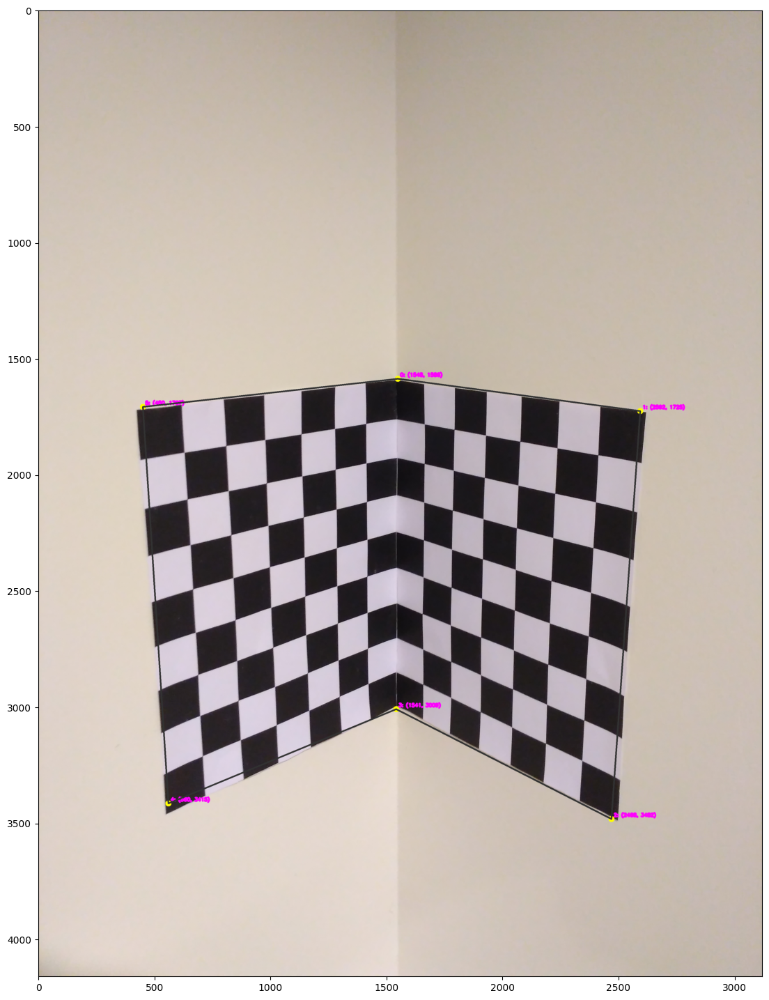

In [565]:
# visualize wireframe
Wireframe(img_path, opencv_wireframes_P_C, line_indices)

Wireframe in this case is not that much accurate as in above case. 

### 2. [1 point] Repeat Q2.1, for the second image assign1.jpg. Does the wireframe overlay show significant distor- tions? Comment. What can we say about the computed projection matrix when trying to do calibration based on world coordinate points that are co-planar? (Hint: we looked at co-planar points in two-view geometry).

The distortion is less here as compare to above.
Coplanar points are highly sensitive to noise and errors in their detection or calibration. Even small inaccuracies in the detected points or calibration process can significantly affect the computed projection matrix, leading to distortions or inaccuracies in the projected images.


In [566]:
criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)

In [567]:

grid_size = 5  # Grid size for x and y coordinates

# Generate object points with varying coordinates
grid_size = 5  

# Generate object points with varying coordinates
points_on_object = np.array([[i, j, 0] for i in range(1, grid_size + 1) for j in range(1, grid_size + 1)], dtype=np.float32)

In [568]:
img2  = "assign1.jpg"


# Arrays to store object points and image points from all the images.
points_on_object_points = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.
fname = img2
img_assign = cv.imread(fname)
gray_assign = cv.cvtColor(img_assign, cv.COLOR_BGR2GRAY)
# Find the chess board corners
ret, corners = cv.findChessboardCorners(gray_assign, (5,5), None)

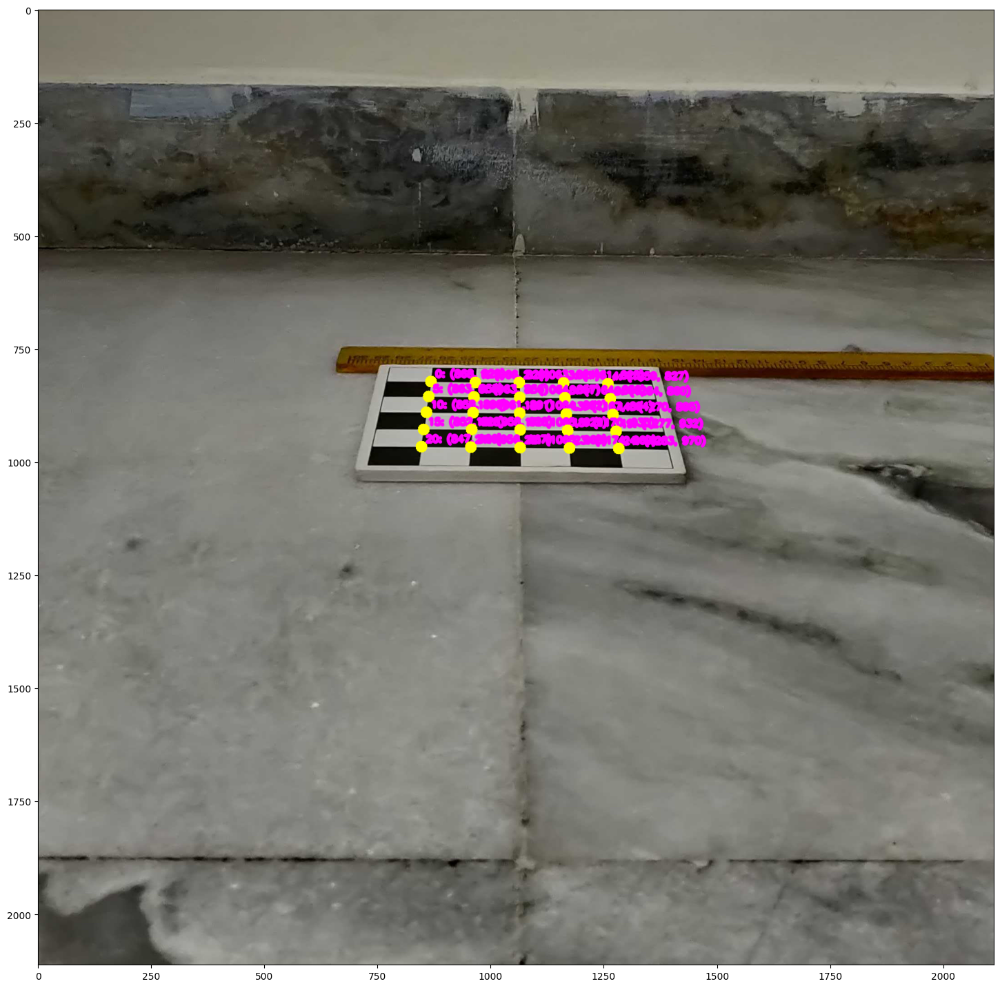

In [569]:

# Arrays to store object points and image points from all the images.
points_on_object_points = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.


# If found, add object points, image points (after refining them)
if ret == True:
    points_on_object_points.append(points_on_object)
    corners2 = cv.cornerSubPix(gray_assign,corners, (11,11), (-1,-1), criteria)
    imgpoints.append(corners2)
    # Draw and display the corners
#     cv.drawChessboardCorners(img, (5,5), corners2, ret)
    corners = np.int0(corners)

    draw_points(img_assign, corners)
    display_image(img_assign)

else:
    print("False")
    


In [570]:
points_on_object_points = np.array(points_on_object_points,dtype=np.float32)
imgpoints = np.array(imgpoints, dtype=np.float32).reshape((1,25,2))
new_imageSize = gray_assign.shape[::-1]


In [571]:


new_retval, new_camera_matrix, new_dist_coeffs, new_rvecs, new_tvecs = cv.calibrateCamera(points_on_object_points, imgpoints, new_imageSize, None, None)
# Print retval
new_R, _ = cv.Rodrigues(new_rvecs[0])

# Compute the projection matrix
new_P = np.dot(new_camera_matrix, np.hstack((new_R, new_tvecs[0])))
print("Reprojection error (retval):", new_retval)
print("Camera matrix:\n", new_camera_matrix)
print("Distortion coefficients:\n", new_dist_coeffs)
print("All rvecs:\n", new_rvecs)
print("All tvecs:\n", new_tvecs)
print("Projection Matrix:", new_P)

Reprojection error (retval): 0.19514642331896637
Camera matrix:
 [[3.02978433e+03 0.00000000e+00 1.09526796e+03]
 [0.00000000e+00 1.81108320e+03 1.03117632e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
Distortion coefficients:
 [[ 7.01512152e-02 -1.50695180e+01  2.47661236e-02  5.69855597e-03
   4.45713839e+02]]
All rvecs:
 (array([[ 1.69112331],
       [ 1.69554159],
       [-0.75381825]]),)
All tvecs:
 (array([[-3.33413939],
       [-4.23446901],
       [31.43024522]]),)
Projection Matrix: [[-7.98403522e+02  3.06173237e+03 -6.06260410e+02  2.43228172e+04]
 [ 3.80510866e+02  6.25606149e+01 -2.04808316e+03  2.47411489e+04]
 [-7.63995447e-01  3.08869003e-02 -6.44481929e-01  3.14302452e+01]]


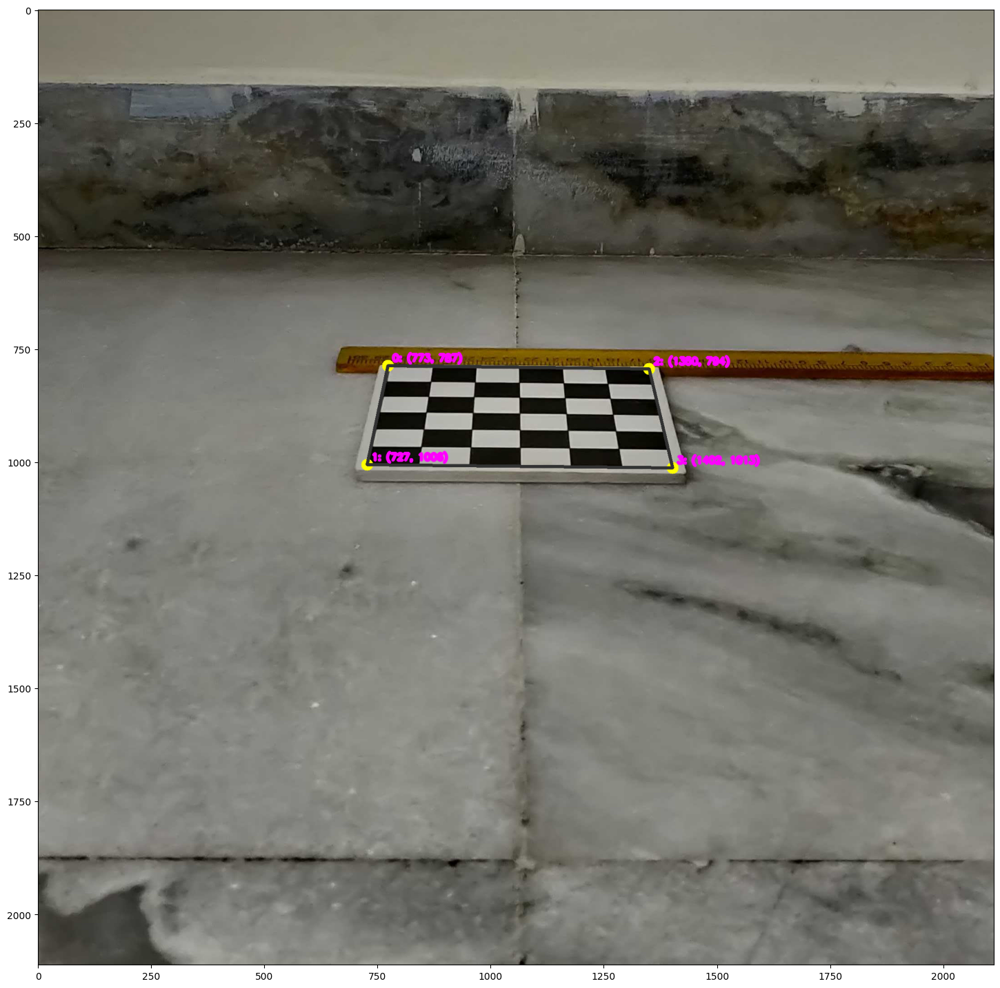

In [572]:
new_wireframes_W_C = np.array([[0,0,0],[6,0,0],[0,6,0],[6,6,0]])
l_i = [(0, 2), (2, 3), (3, 1), (1, 0)]
new_wireframes_P_C = get_pixel_coord(new_wireframes_W_C,new_P)
Wireframe(img2, new_wireframes_P_C, l_i)

### 3. [0.5 points] What is the image of the world origin, given the calibration matrix? Does this result agree with your observations?

In [573]:
# Generate object points with varying coordinates
grid_size = 7  # Grid size for x and y coordinates

# Prepare object points
new_w_o_c = np.zeros((7*7, 3), np.float32)
for i in range(0, grid_size ):
    for j in range(0, grid_size ):
        new_w_o_c[(i ) * grid_size + (j)] = [i, j, 0]
# print(new_W_C)

Yes, the required image is satisfactory.

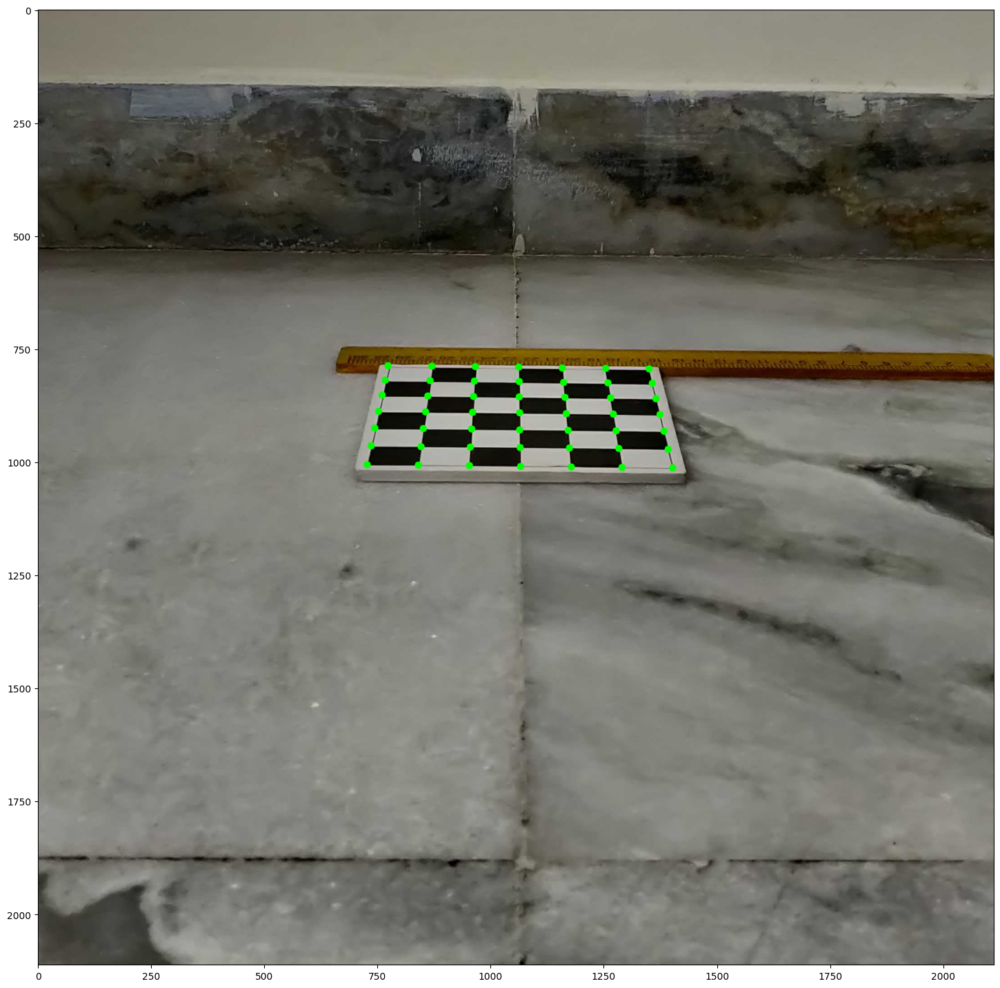

In [574]:


new_o_p_c =[]
# Iterate over each world coordinate and compute its pixel coordinates
for world_co in new_w_o_c:
    pixel_co = compute_P_C(new_P, world_co)
    new_o_p_c.append(pixel_co)

# Convert the list to a NumPy array
new_o_p_c = np.array(new_o_p_c)
img = cv.imread(img2)
for idx, point in enumerate(new_o_p_c):
    x, y = map(int, point)
    cv.circle(img, (x, y),8, (0, 255, 0), -1)

display_image(img)


# Q3. Moving the Chessboard [3 points]

### 1. [1.5 points] Imagine that the chessboard in assign1.jpg was moved by 10 cm to the right (along the ruler). Overlay a wireframe (4 points) of the virtual chessboard on the image at the appropriate location. Does the wireframe look consistent with what you expect?

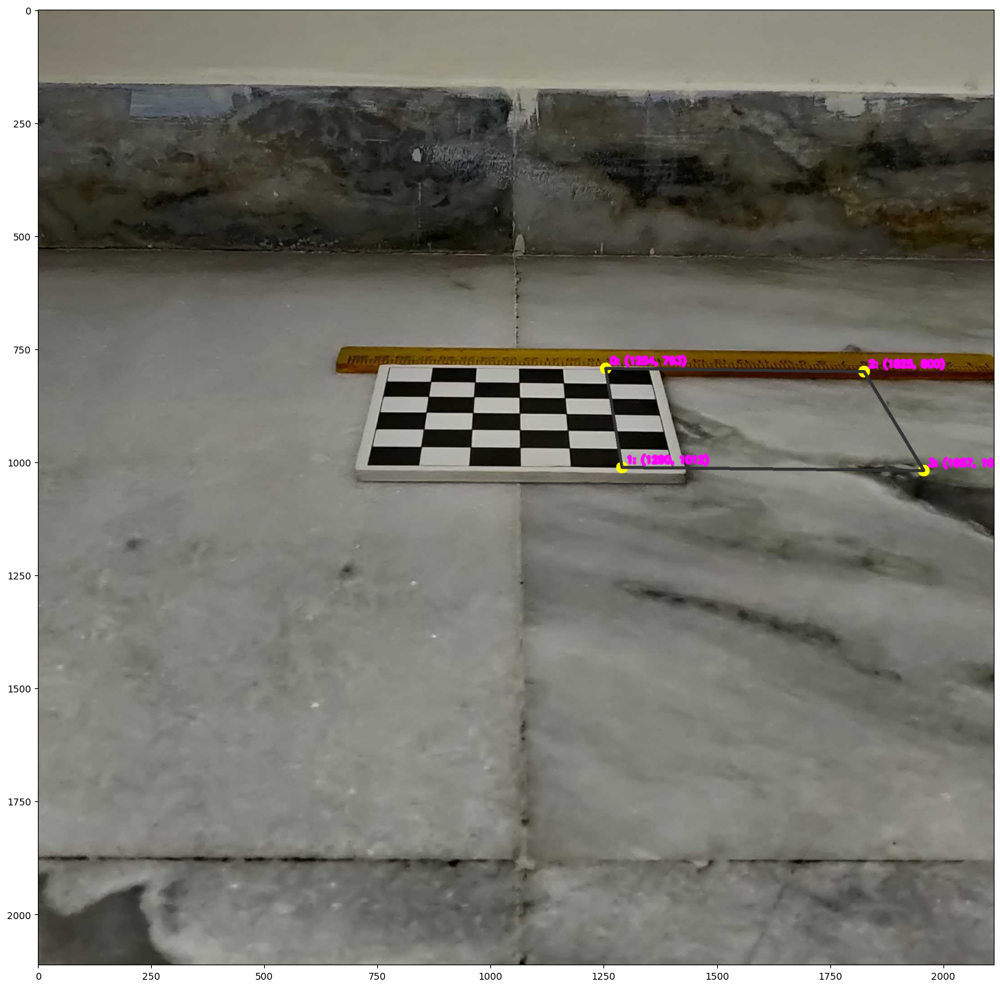

In [576]:

new_moved_world_origin_coordinates = np.array([[0,5,0],[6,5,0],[0,11,0],[6,11,0]])
# new_wireframes_W_C = np.array([[2,2,0],[2,8,0],[10,2,0],[10,8,0]])
new_moved_line_indices = [(0, 2), (2, 3), (3, 1), (1, 0)]
new_moved_wireframes_P_C =[]
# Iterate over each world coordinate and compute its pixel coordinates
for world_co in new_moved_world_origin_coordinates:
    pixel_co = compute_P_C(new_P, world_co)
    new_moved_wireframes_P_C.append(pixel_co)

# Convert the list to a NumPy array
new_moved_wireframes_P_C = np.array(new_moved_wireframes_P_C)

# print(new_wireframes_P_C)
# print(wireframes_P_C)
# visualize wireframe
Wireframe(img2, new_moved_wireframes_P_C, new_moved_line_indices)
# print(new_world_coordinate

Yes it's look consistent.


### 2. [1.5 points] Now, think of how you would move the actual pixels or pattern of the chessboard? Overlay the chessboard pattern within the predicted wireframe. Is the overlay consistent with what you expect?